# STopover_visium sample code

## Load STopover & Prepare

In [1]:
from STopover import STopover_visium

In [2]:
import os

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID" # run on GPU
os.environ["CUDA_VISIBLE_DEVICES"]="0"

import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns

In [3]:
outdir = './Results/Test'

### Read single-cell dataset (GSE131907) with cell type annotation in .obs as 'Cell_subtype'

##### Cells with 'Sample_Origin = tLung' were subsetted for analysis¶

In [ ]:
sc_adata = sc.read_h5ad('sc_lung_cancer.h5ad')

In [7]:
sc_adata = sc_adata[sc_adata.obs['Sample_Origin']=='tLung']

In [8]:
sc_adata

View of AnnData object with n_obs × n_vars = 45149 × 29634
    obs: 'Barcode', 'Sample', 'Sample_Origin', 'Cell_type', 'Cell_type.refined', 'Cell_subtype'

##### Reassign Undetermined and NaN in 'Cell_subtype' into _ns subtype

In [9]:
sc_adata.obs['Cell_subtype'] = sc_adata.obs['Cell_subtype'].astype(object)
sc_adata.obs['Cell_type'] = sc_adata.obs['Cell_type'].astype(object)

sc_adata.obs['Cell_subtype'] = sc_adata.obs['Cell_subtype'].where(sc_adata.obs['Cell_subtype'].ne('Undetermined'), sc_adata.obs['Cell_type']+'_ns')
sc_adata.obs['Cell_subtype'] = sc_adata.obs['Cell_subtype'].fillna(sc_adata.obs['Cell_type']+'_ns')

In [10]:
sc_adata.obs

,Barcode,Sample,Sample_Origin,Cell_type,Cell_type.refined,Cell_subtype
AAACCTGAGACGACGT_LUNG_T09,AAACCTGAGACGACGT,LUNG_T09,tLung,Myeloid cells,Myeloid cells,CD1c+ DCs
AAACCTGAGACGACGT_LUNG_T34,AAACCTGAGACGACGT,LUNG_T34,tLung,B lymphocytes,B lymphocytes,Follicular B cells
AAACCTGAGACGCTTT_LUNG_T18,AAACCTGAGACGCTTT,LUNG_T18,tLung,Epithelial cells,Epithelial cells,tS2
AAACCTGAGACTGTAA_LUNG_T34,AAACCTGAGACTGTAA,LUNG_T34,tLung,Epithelial cells,Epithelial cells,tS2
AAACCTGAGATATGCA_LUNG_T25,AAACCTGAGATATGCA,LUNG_T25,tLung,T lymphocytes,T/NK cells,CD4+ Th
...,...,...,...,...,...,...
TTTGTCATCTCACATT_LUNG_T31,TTTGTCATCTCACATT,LUNG_T31,tLung,T lymphocytes,T/NK cells,CD8+/CD4+ Mixed Th
TTTGTCATCTGCGACG_LUNG_T31,TTTGTCATCTGCGACG,LUNG_T31,tLung,Fibroblasts,NaN,Fibroblasts_ns
TTTGTCATCTTGCCGT_LUNG_T30,TTTGTCATCTTGCCGT,LUNG_T30,tLung,Epithelial cells,Epithelial cells,tS1
TTTGTCATCTTTACAC_LUNG_T25,TTTGTCATCTTTACAC,LUNG_T25,tLung,B lymphocytes,B lymphocytes,Follicular B cells


### Read 10X-formatted Visium dataset

In [ ]:
sp_adata = sc.read_visium('~/sp_data')

In [17]:
sp_adata.var_names_make_unique()

### Run CellDART for cell type deconvolution

#### Installation of CellDART

In [ ]:
import sys
!{sys.executable} -m pip install git+https://github.com/mexchy1000/CellDART.git

#### Run CellDART

In [20]:
from CellDART.pred_cellf_celldart import pred_cellf_celldart

celltype='Cell_subtype'

spatial_final = pred_cellf_celldart(adata_sp=sp_adata, adata_sc=sc_adata, count_from_raw = False,
                                    gpu=True, celltype=celltype, num_markers=20,
                                    nmix=10, npseudo=5*sp_adata.shape[0],
                                    alpha=1, alpha_lr=5, batch_size=512,  
                                    emb_dim=64, n_iterations=3000, init_train_epoch=10,  
                                    outdir='./Results/Test', return_anndata=True)

GPU is available and will be used
Shape of the provided spatial data is (1797, 36601)
Shape of the provided single-cell data is (45149, 29634)
Total number of marker genes:  457
Size of spatial, single-cell, pseudospot, and cell fraction data: (1797, 457) (45149, 457) (8985, 457) (8985, 47)
Train on 8985 samples
Epoch 1/10
8985/8985 [==============================] - 1s 147us/sample - loss: 1.4873 - mae: 0.0276
Epoch 2/10
8985/8985 [==============================] - 0s 7us/sample - loss: 1.1215 - mae: 0.0236
Epoch 3/10
8985/8985 [==============================] - 0s 7us/sample - loss: 0.9645 - mae: 0.0217
Epoch 4/10
8985/8985 [==============================] - 0s 7us/sample - loss: 0.8412 - mae: 0.0199
Epoch 5/10
8985/8985 [==============================] - 0s 6us/sample - loss: 0.7459 - mae: 0.0185
Epoch 6/10
8985/8985 [==============================] - 0s 6us/sample - loss: 0.6728 - mae: 0.0174
Epoch 7/10
8985/8985 [==============================] - 0s 6us/sample - loss: 0.6155 - mae

In [21]:
spatial_final.obs

,in_tissue,array_row,array_col,Exhausted CD8+ T_cellf,CD141+ DCs_cellf,Cytotoxic CD8+ T_cellf,B lymphocytes_ns_cellf,Tumor ECs_cellf,Follicular B cells_cellf,T lymphocytes_ns_cellf,...,mo-Mac_cellf,Stalk-like ECs_cellf,tS3_cellf,NK cells_ns_cellf,MAST_cellf,Fibroblasts_ns_cellf,NK_cellf,CD8 low T_cellf,CD8+/CD4+ Mixed Th_cellf,EPCs_cellf
AAACAGAGCGACTCCT-1,1,14,94,0.032296,0.005279,0.028518,0.004367,0.002981,0.024973,0.097472,...,0.009631,0.001230,0.003652,0.048215,0.008604,0.005322,0.055858,0.025636,0.044580,0.000865
AAACCGTTCGTCCAGG-1,1,52,42,0.021198,0.003225,0.006938,0.001881,0.007138,0.027787,0.103996,...,0.154839,0.003210,0.003326,0.008455,0.004598,0.008176,0.016467,0.007280,0.026307,0.001655
AAACGAGACGGTTGAT-1,1,35,79,0.027125,0.007513,0.015559,0.004084,0.007582,0.023987,0.096134,...,0.071229,0.004768,0.003592,0.024853,0.006180,0.011755,0.036066,0.010300,0.034336,0.010347
AAACTGCTGGCTCCAA-1,1,45,67,0.026758,0.004641,0.011254,0.002520,0.006227,0.023788,0.112160,...,0.136154,0.003252,0.002301,0.017930,0.005255,0.009055,0.030270,0.008346,0.033467,0.004277
AAAGACCCAAGTCGCG-1,1,10,48,0.017802,0.005734,0.011827,0.007309,0.012257,0.084796,0.093825,...,0.035254,0.005053,0.001448,0.016450,0.003181,0.016264,0.020599,0.010845,0.037470,0.007967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTGTATGCCACCAA-1,1,56,60,0.034431,0.008985,0.025247,0.004259,0.000874,0.019873,0.083223,...,0.046474,0.000689,0.010687,0.024086,0.008706,0.002274,0.038216,0.016832,0.040480,0.001018
TTGTGTTTCCCGAAAG-1,1,51,59,0.026845,0.002095,0.006366,0.001123,0.005390,0.019627,0.132552,...,0.191967,0.002001,0.001851,0.008478,0.003628,0.005822,0.018908,0.006613,0.029592,0.000928
TTGTTAGCAAATTCGA-1,1,22,42,0.019972,0.003744,0.010552,0.002758,0.037619,0.013107,0.070957,...,0.025165,0.019451,0.003041,0.018128,0.006372,0.024912,0.019191,0.008877,0.030523,0.011730
TTGTTCAGTGTGCTAC-1,1,24,64,0.028984,0.007713,0.022007,0.005021,0.007367,0.021901,0.091841,...,0.023703,0.004776,0.005695,0.036260,0.008592,0.013778,0.045486,0.015413,0.042056,0.009351


#### Remove _cellf in the end of column names

In [36]:
spatial_final.obs.columns = [i[:-6] if i.endswith('_cellf') else i for i in spatial_final.obs.columns]

## Topological similarity analysis

In [37]:
cell_types = spatial_final.obs.columns[3:-1]
cell_types

Index(['Exhausted CD8+ T', 'CD141+ DCs', 'Cytotoxic CD8+ T',
       'B lymphocytes_ns', 'Tumor ECs', 'Follicular B cells',
       'T lymphocytes_ns', 'CD1c+ DCs', 'Treg', 'Myeloid cells_ns',
       'Activated DCs', 'Epithelial cells_ns', 'Mesothelial cells',
       'Tip-like ECs', 'CD163+CD14+ DCs', 'Exhausted Tfh',
       'COL14A1+ matrix FBs', 'Pleural Mac', 'Naive CD4+ T',
       'Smooth muscle cells', 'GC B cells in the LZ', 'tS1', 'Naive CD8+ T',
       'Plasma cells', 'Monocytes', 'Alveolar Mac', 'GC B cells in the DZ',
       'Pericytes', 'CD207+CD1a+ LCs', 'MALT B cells', 'pDCs',
       'COL13A1+ matrix FBs', 'CD4+ Th', 'tS2', 'Lymphatic ECs',
       'Myofibroblasts', 'Endothelial cells_ns', 'mo-Mac', 'Stalk-like ECs',
       'tS3', 'NK cells_ns', 'MAST', 'Fibroblasts_ns', 'NK', 'CD8 low T',
       'CD8+/CD4+ Mixed Th'],
      dtype='object')

#### Create list of cell type pairs

In [38]:
cell_pairs = pd.DataFrame([(j,k) for i,j in enumerate(cell_types) for k in cell_types[i+1:]])
cell_pairs

,0,1
0,Exhausted CD8+ T,CD141+ DCs
1,Exhausted CD8+ T,Cytotoxic CD8+ T
2,Exhausted CD8+ T,B lymphocytes_ns
3,Exhausted CD8+ T,Tumor ECs
4,Exhausted CD8+ T,Follicular B cells
...,...,...
1030,Fibroblasts_ns,CD8 low T
1031,Fibroblasts_ns,CD8+/CD4+ Mixed Th
1032,NK,CD8 low T
1033,NK,CD8+/CD4+ Mixed Th


### 1. Extract colocalized regions between cell types

#### Visualize spatial map of cell types

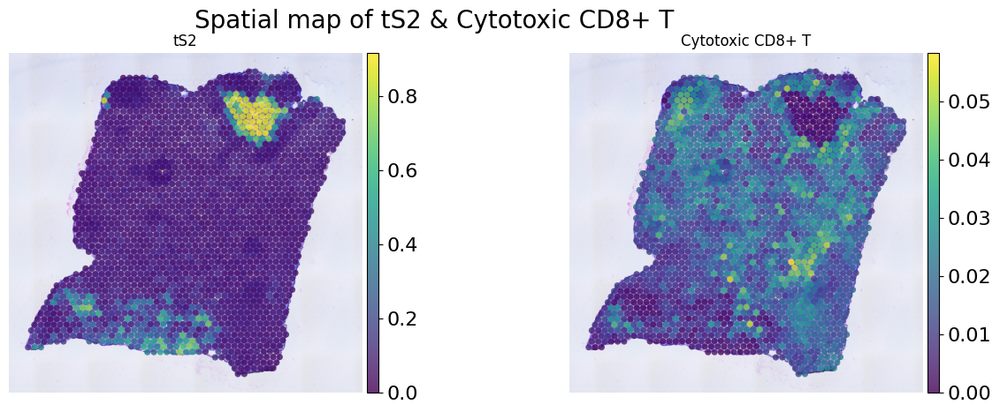

In [44]:
import matplotlib.pyplot as plt
testcells = ['tS2','Cytotoxic CD8+ T']
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams["figure.figsize"] = (15,5)
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams["legend.framealpha"] = 0.2

fig, axs = plt.subplots(1, 2)
  
for visnum in range(len(testcells)):
    sc.pl.spatial(spatial_final, img_key='hires', color=testcells[visnum], vmin=0,
                  palette='Set1', size=1.5, alpha = 0.8, alpha_img = 1,
                  ax = axs[visnum], show = False)
    axs[visnum].set_title(testcells[visnum], fontsize=12)
    axs[visnum].axis('off')

plt.suptitle('Spatial map of tS2 & Cytotoxic CD8+ T', fontsize=20)
plt.savefig(os.path.join(outdir,'Spatial_lung_CellDART_CD8_celltypes.png'), dpi=200)
plt.show()

#### Extract colocalization patterns btw cell types

In [45]:
spatial_final_mod = STopover_visium(sp_adata=spatial_final, lognorm=True,
                                    min_size=20, fwhm=2.5, thres_per=30, 
                                    save_path=outdir)
    
spatial_final_mod.topological_similarity(feat_pairs=cell_pairs, J_result_name='result')

End of data preparation
Elapsed time: 0.03 seconds 
End of computation for topological similarity
Elapsed time: 7.61 seconds 
End of the whole process: 9.95 seconds


#### Extract dataframe for jaccard similarity index (J_comp)

In [47]:
df_mod = spatial_final_mod.uns['J_result_0']
df_mod['min_size'], df_mod['fwhm'], df_mod['percent'] = 20, 2.5, 30

#### Save the dataframe for J_comp

In [50]:
df_mod.to_csv(os.path.join(outdir, 'jaccard_composite_celltype.csv'), sep = ',', header=True, index=False)

#### Save the STopover_visium object

In [51]:
spatial_final_mod.save_connected_loc_data(save_format='h5ad', filename = 'sp_visium_celltype')  

#### Load topology result and visualize top interacting cell types (for percentage)

In [52]:
df = pd.read_csv(os.path.join(outdir, 'jaccard_composite_celltype.csv'))

In [53]:
df

,group,Feat_1,Feat_2,Avg_1,Avg_2,J_comp,min_size,fwhm,percent
0,0,Exhausted CD8+ T,CD141+ DCs,0.028255,0.005795,0.194993,20,2.5,30
1,0,Exhausted CD8+ T,Cytotoxic CD8+ T,0.028255,0.018249,0.613115,20,2.5,30
2,0,Exhausted CD8+ T,B lymphocytes_ns,0.028255,0.003935,0.281633,20,2.5,30
3,0,Exhausted CD8+ T,Tumor ECs,0.028255,0.007431,0.069245,20,2.5,30
4,0,Exhausted CD8+ T,Follicular B cells,0.028255,0.024553,0.148402,20,2.5,30
...,...,...,...,...,...,...,...,...,...
1030,0,Fibroblasts_ns,CD8 low T,0.009528,0.014396,0.026634,20,2.5,30
1031,0,Fibroblasts_ns,CD8+/CD4+ Mixed Th,0.009528,0.035438,0.081556,20,2.5,30
1032,0,NK,CD8 low T,0.039802,0.014396,0.548387,20,2.5,30
1033,0,NK,CD8+/CD4+ Mixed Th,0.039802,0.035438,0.462875,20,2.5,30


#### Create barplot for the top overlapping cell types

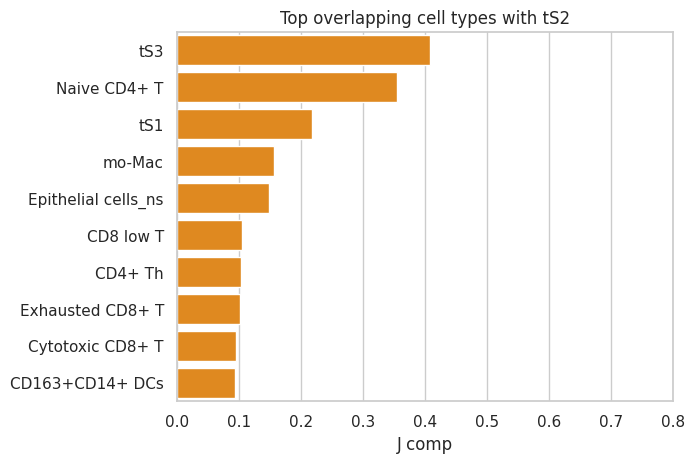

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams.update(plt.rcParamsDefault)
sns.set_theme(style="whitegrid")

min_size = 20
fwhm = 2.5
per = 30

# Initialize the matplotlib figure
df2_1 = df[(df['Feat_1']=='tS2') & (df['percent']==per)].copy()
df2_2 = df[(df['Feat_2']=='tS2') & (df['percent']==per)].copy()
df2_1['Jcomp'] = df2_1['J_comp']; df2_1['Feat'] = df2_1['Feat_2']
df2_2['Jcomp'] = df2_2['J_comp']; df2_2['Feat'] = df2_2['Feat_1']
df3 = pd.concat([df2_1, df2_2], axis=0)
df3 = df3.sort_values(by='J_comp',ascending=False).head(10)

p = sns.barplot(x="J_comp", y="Feat", data=df3, label="Cell types", color="darkorange")

# Add a legend and informative axis label
p.set_title("Top overlapping cell types with tS2", fontsize=12)
p.set(xlim=(0, 0.8), ylabel="", xlabel="J comp")

plt.savefig(os.path.join(outdir,'Spatial_lung_Jmmx_tS2_'+str(min_size)+'_'+str(fwhm)+'_'+str(per)+'_total.png'), dpi=200)
plt.show()

#### Visualize colocalized regions of a cell type pair

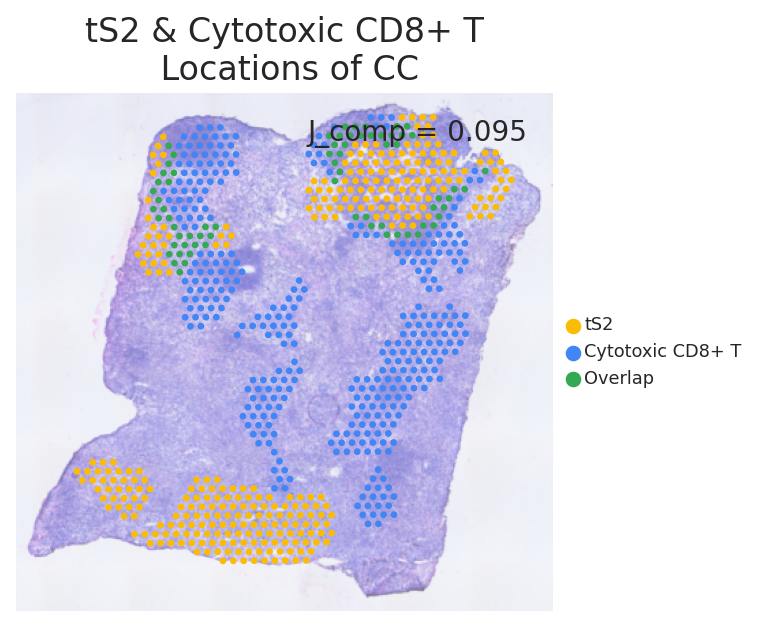

In [59]:
spatial_final_mod.vis_all_connected(spot_size=1, alpha_img=0.6, alpha=1,  
                                    feat_name_x='tS2', feat_name_y='Cytotoxic CD8+ T',  
                                    fig_size=(5,5), 
                                    batch_colname ='batch', batch_name='0', image_res='lowres',  
                                    adjust_image=True, border = 500,  
                                    title_fontsize=15, legend_fontsize=8, title = '\n Locations of CC', 
                                    return_axis=False, save=True, dpi=200)

#### Visualize top 8 regions with high local overlap

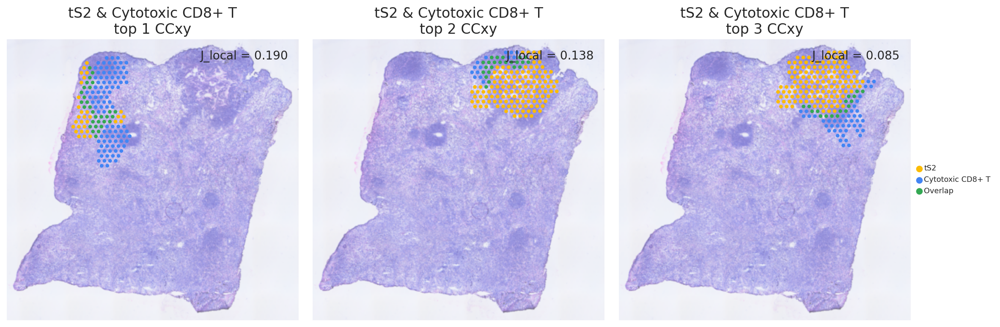

In [69]:
spatial_final_mod.vis_jaccard_top_n_pair(spot_size=1, alpha_img=0.6, alpha=1,  
                                         feat_name_x='tS2', feat_name_y='Cytotoxic CD8+ T',
                                         top_n = 3, ncol = 3,
                                         fig_size=(5,5), 
                                         batch_colname ='batch', batch_name='0', image_res='lowres',  
                                         adjust_image=True, border = 500,  
                                         title_fontsize=15, legend_fontsize=8, title = '', 
                                         return_axis=False, save=True, dpi=200)

#### Reset the CC location data saved in .obs

In [70]:
spatial_final_mod.J_result_reset()

### 2. Extract colocalized regions btw LR pairs (CellTalkDB)

#### Visualize feature map for LR pairs

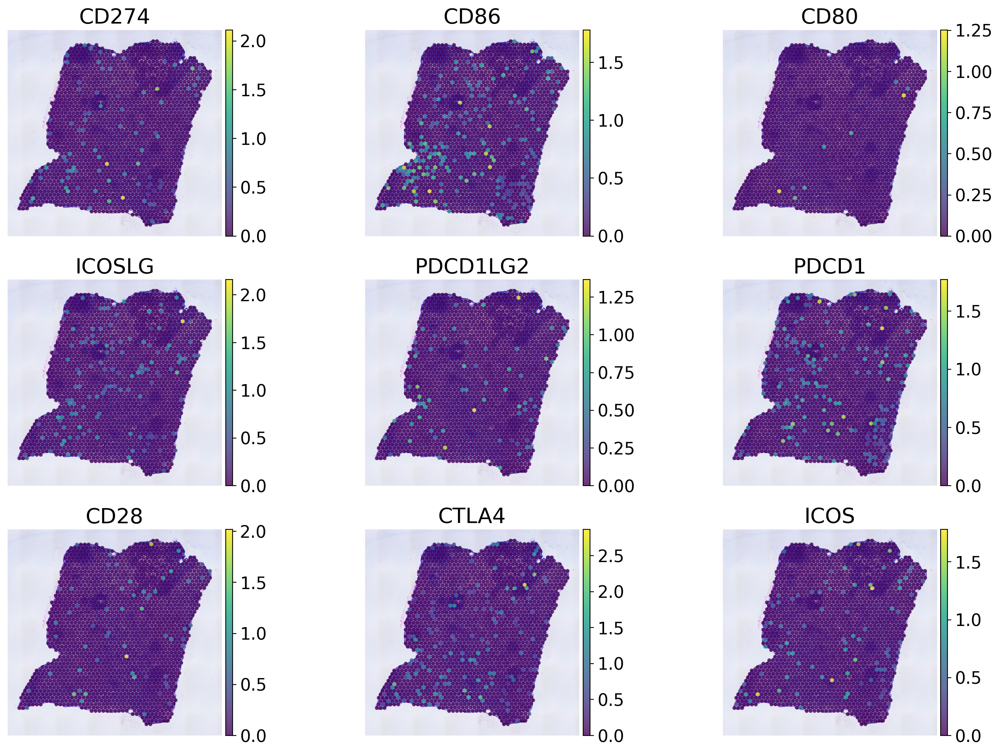

In [78]:
import matplotlib.pyplot as plt

testcells = ['CD274','CD86','CD80','ICOSLG','PDCD1LG2','PDCD1','CD28','CTLA4','ICOS']

plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams["figure.figsize"] = (15,10)
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams["legend.framealpha"] = 0.2

fig, axs = plt.subplots(3, 3, sharey=True, tight_layout=True)
    
for visnum in range(len(testcells)):
    sc.pl.spatial(spatial_final_mod, img_key='hires', color=testcells[visnum], vmin=0,
                  palette='Set1', size=1.5, alpha = 0.8, alpha_img = 1,
                  ax = axs[visnum//3][visnum%3], show = False)
    axs[visnum//3][visnum%3].set_title(testcells[visnum], fontsize=20)
    axs[visnum//3][visnum%3].axis('off')
plt.show()

#### Extract colocalization patterns between LR pairs

In [79]:
spatial_final_mod.topological_similarity(use_lr_db=True, lr_db_species='human', J_result_name='result')

Using CellTalkDB ligand-receptor dataset
End of data preparation
Elapsed time: 0.15 seconds 
End of computation for topological similarity
Elapsed time: 78.14 seconds 
End of the whole process: 81.24 seconds


In [82]:
spatial_final_mod.save_path

'./Results/Test'

#### Save STopover object to the save_dir

In [83]:
spatial_final_mod.save_connected_loc_data(save_format='h5ad', filename = 'lr_pair_cc')

#### Extract dataframe for jaccard similarity index (J_comp)

In [87]:
df_mod = spatial_final_mod.uns['J_result_0']
df_mod['min_size'], df_mod['fwhm'], df_mod['percent'] = 20, 2.5, 30
df_mod.to_csv(os.path.join(outdir, 'top_sim_lung_cancer_lr_pair.csv'),
              sep = ',', header=True, index=False)

In [88]:
df2 = df_mod.sort_values(by=['J_comp'], ascending=[False])

In [89]:
df2

,group,Feat_1,Feat_2,Avg_1,Avg_2,J_comp,min_size,fwhm,percent
1586,0,CCL19,CCR7,1.087441,0.121309,0.456897,20,2.5,30
753,0,PIP,AQP5,0.028641,0.053052,0.404130,20,2.5,30
1090,0,FN1,ITGB1,2.263317,1.340442,0.385257,20,2.5,30
2421,0,CCL14,ACKR1,0.520236,0.498923,0.383824,20,2.5,30
1205,0,S100A9,ITGB2,0.447139,1.360005,0.371537,20,2.5,30
...,...,...,...,...,...,...,...,...,...
1785,0,CUBN,LRP2,0.017668,0.002148,0.000000,20,2.5,30
1786,0,HSPA8,LRP2,0.911067,0.002148,0.000000,20,2.5,30
1789,0,HSPG2,LRP2,1.545092,0.002148,0.000000,20,2.5,30
1792,0,SHH,LRP2,0.005441,0.002148,0.000000,20,2.5,30


#### Import CellTalkDB database and select L-R of interest

In [93]:
lr_pairs = spatial_final_mod.return_celltalkdb('human')[['ligand_gene_symbol','receptor_gene_symbol']]
feat_pairs = lr_pairs[lr_pairs['ligand_gene_symbol'].isin(['CD86','CD80','ICOSLG','HLA-DR','CD274','PDCD1LG2','CD274'])].values

In [94]:
lr_pairs

,ligand_gene_symbol,receptor_gene_symbol
0,SEMA3F,PLXNA3
1,SEMA3F,PLXNA1
2,SEMA3F,NRP1
3,SEMA3F,NRP2
4,CX3CL1,CX3CR1
...,...,...
3393,CGA,GPR84
3394,ASIP,MC1R
3395,VEGFA,ITGB3
3396,APELA,APLNR


#### Extract LR pairs containing selected ligands

In [96]:
feat_pairs = lr_pairs[lr_pairs['ligand_gene_symbol'].isin(['CD86','CD80','ICOSLG','HLA-DR','CD274','PDCD1LG2','CD274'])].values

In [97]:
feat_pairs

array([['PDCD1LG2', 'PDCD2'],
       ['CD274', 'CD80'],
       ['CD86', 'CTLA4'],
       ['ICOSLG', 'ICOS'],
       ['CD86', 'CD28'],
       ['PDCD1LG2', 'PDCD1'],
       ['CD274', 'PDCD1']], dtype=object)

#### Visualize colocalized regions of LR pairs

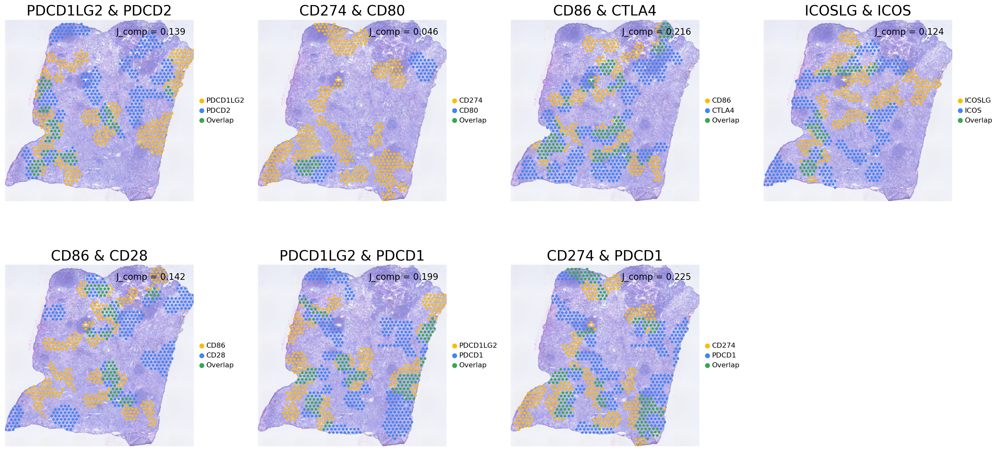

In [101]:
f, ax = plt.subplots(2, 4, figsize=(20, 10), sharey=False, tight_layout=True)
for index, (feat_x, feat_y) in enumerate(feat_pairs[:8]):
    spatial_final_mod.vis_all_connected(spot_size=1, 
                                        alpha_img=0.6, alpha=1,  
                                        feat_name_x=feat_x, feat_name_y=feat_y,
                                        fig_size=(5,5),
                                        adjust_image=True, border = 50,  
                                        title_fontsize=20, title = '', 
                                        return_axis=False, 
                                        axis=ax[index//4][index%4],
                                        save=False)
ax[1][3].axis('off')
plt.show()

#### Visualize top 8 regions with high local overlap (CD274 - PDCD1)

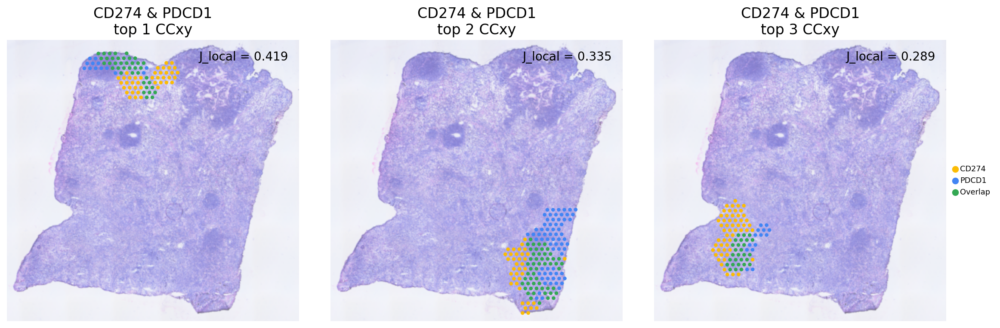

In [112]:
spatial_final_mod.vis_jaccard_top_n_pair(spot_size=1, alpha_img=0.6, alpha=1,  
                                         feat_name_x='CD274', feat_name_y='PDCD1',
                                         top_n = 3, ncol = 3,
                                         fig_size=(5,5), 
                                         batch_colname ='batch', batch_name='0', image_res='lowres',  
                                         adjust_image=True, border = 500,  
                                         title_fontsize=15, legend_fontsize=8, title = '', 
                                         return_axis=False, save=True, dpi=200)

### 3. Estimate cell type-specific colocalized regions btw LR pairs

#### Intersection between colocalized domain of tS2-Cytotoxic CD8 T & LR pairs

In [120]:
spatial_final_celltype = STopover_visium(sp_load_path=os.path.join(outdir,'sp_visium_celltype_adata.h5ad'),
                                         lognorm=False, save_path=outdir)
spatial_final_mod = STopover_visium(sp_load_path=os.path.join(outdir,'lr_pair_cc_adata.h5ad'),
                                    lognorm=False, save_path=outdir)
df_over = (spatial_final_celltype.obs['Comb_CC_tS2'] != 0) * (spatial_final_celltype.obs['Comb_CC_Cytotoxic CD8+ T'] != 0)
spatial_final_mod.obs['tS2_T'] = df_over.astype('category')
spatial_final_mod_over = spatial_final_mod[spatial_final_mod.obs['tS2_T'] != 0].copy()

adata_ts2_T = STopover_visium(sp_adata = spatial_final_mod_over, lognorm=False, save_path=outdir)

Anndata object is not provided: searching for files in 'sp_load_path'
Anndata object is not provided: searching for files in 'sp_load_path'


#### Visualize colocalized regions of a tS2-CD8 T-specific LR

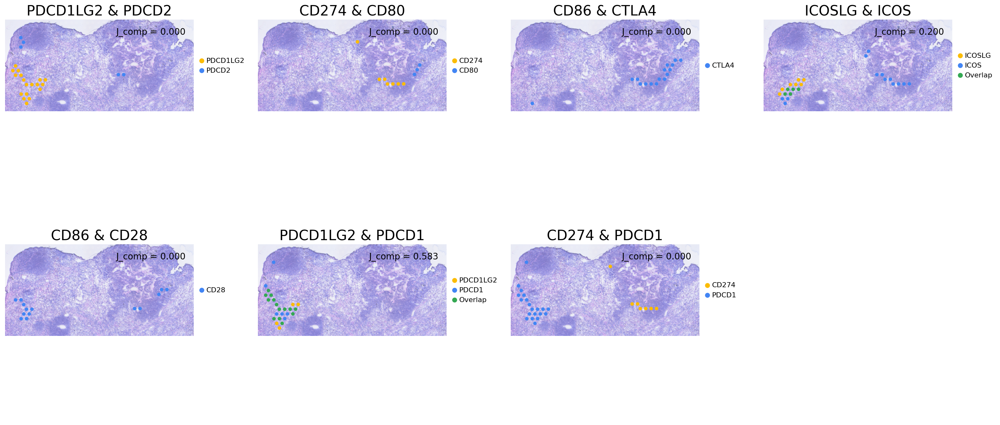

In [123]:
f, ax = plt.subplots(2, 4, figsize=(20, 10), sharey=False, tight_layout=True)
for index, (feat_x, feat_y) in enumerate(feat_pairs[:8]):
    adata_ts2_T.vis_all_connected(spot_size=1, 
                                  alpha_img=0.6, alpha=1,  
                                  feat_name_x=feat_x, feat_name_y=feat_y,
                                  fig_size=(5,5), image_res='hires',
                                  adjust_image=True, border = 500,  
                                  title_fontsize=20, title = '', 
                                  return_axis=False, 
                                  axis=ax[index//4][index%4],
                                  save=False)
ax[1][3].axis('off')
plt.show()